In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv('train.csv')

In [6]:
df.sample(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
24427,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1486,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2009,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
37456,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20420,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
df.shape

(42000, 785)

In [8]:
X = df.iloc[:,1:785]

In [9]:
X.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
y = df.iloc[:,0]

In [11]:
y.head()

0    1
1    0
2    1
3    4
4    0
Name: label, dtype: int64

In [12]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [13]:
X_train.shape

(33600, 784)

## Appply knn algo 

In [14]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

In [15]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [17]:
y_pred = knn.predict(X_test)

In [32]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9691666666666666

In [35]:
from sklearn.model_selection import cross_val_score
print(cross_val_score(knn, X_train, y_train, cv=10).mean())

0.9651785714285716


## Now applying PCA as we had 784 columns

1] Applying Standardization

In [24]:
from sklearn.preprocessing import StandardScaler
sn = StandardScaler()
X_train_trf = sn.fit_transform(X_train)
X_test_trf = sn.transform(X_test)

In [25]:
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [26]:
X_train_trf.shape

(33600, 100)

In [27]:
knn = KNeighborsClassifier()

In [30]:
knn.fit(X_train_trf,y_train)
y_pred = knn.predict(X_test_trf)

In [31]:
accuracy_score(y_test,y_pred)

0.9691666666666666

In [ ]:
features = []
accuracies = []

# Loop through PCA components
for i in range(1, 50): 
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)

    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train_trf, y_train)

    y_pred = knn.predict(X_test_trf)
    
    features.append(i)  # Store the number of features
    accuracies.append(accuracy_score(y_test, y_pred))  # Store accuracy
    print(i)



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45


In [ ]:
plt.plot(features,accuracies)
plt.xlabel("Number of Principal Components") 
plt.ylabel("Accuracy") 
plt.title("PCA Components vs. Accuracy")
plt.show()

## For finding optimal value of number of componenets , atleast 90% variance should be explained

In [41]:
pca.explained_variance_

array([335506.57620544, 244807.10511442, 212051.0345165 , 185066.15331643,
       168000.24596853, 148918.34905623, 112510.83340209,  99329.48444433,
        95140.26441454,  79978.97709016,  71872.98931731,  70295.41855281,
        58642.17064567,  57797.84788158,  54416.08107528,  51094.27632925,
        45432.48090442,  44087.7557423 ,  40634.96784429,  39529.38503822,
        36946.57183798,  35169.451414  ,  33191.94921844,  31498.07839924,
        30379.28062781,  28621.64409406,  27987.85491942,  26623.31466668,
        25478.29769701,  23807.36816765,  22692.17429755,  21743.11666432,
        20713.09877465,  20215.78534799,  19292.09319353,  18537.71836944,
        17440.58129125,  16726.94208682,  16181.85994331,  15951.91565979,
        15537.57647085,  15248.06049239,  14302.38382139,  13585.34380654,
        13172.16484608,  12812.43656128,  12385.86119838,  11979.30992067,
        11475.73209722,  10919.83699415,  10789.15231972,  10549.79757953,
        10039.28673392,  

In [42]:
pca.components_.shape

(242, 784)

In [43]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09770722, 0.16900067, 0.2307548 , 0.28465032, 0.33357585,
       0.37694429, 0.40971003, 0.43863706, 0.46634409, 0.4896358 ,
       0.51056687, 0.53103851, 0.54811645, 0.56494851, 0.58079573,
       0.59567555, 0.60890653, 0.6217459 , 0.63357974, 0.6450916 ,
       0.65585129, 0.66609344, 0.6757597 , 0.68493267, 0.69377981,
       0.70211509, 0.7102658 , 0.71801912, 0.72543898, 0.73237223,
       0.73898072, 0.74531281, 0.75134494, 0.75723224, 0.76285054,
       0.76824915, 0.77332825, 0.77819952, 0.78291205, 0.78755761,
       0.79208251, 0.7965231 , 0.80068828, 0.80464464, 0.80848068,
       0.81221196, 0.815819  , 0.81930765, 0.82264965, 0.82582976,
       0.82897181, 0.83204415, 0.83496782, 0.83783336, 0.84062454,
       0.84331783, 0.84596712, 0.84853351, 0.85106204, 0.85351457,
       0.85592008, 0.85831105, 0.86057999, 0.86279635, 0.8649424 ,
       0.86700054, 0.86901774, 0.87098082, 0.87291702, 0.87479944,
       0.87665559, 0.87847316, 0.88022525, 0.88195105, 0.88360

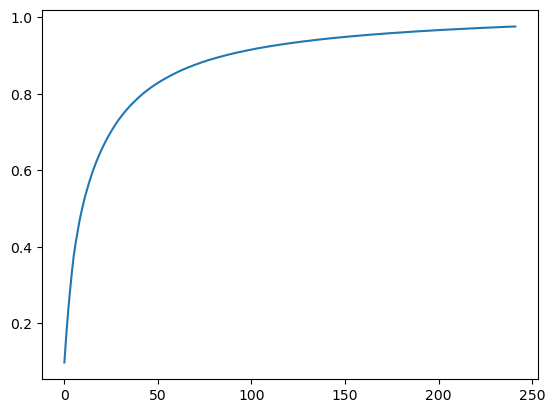

In [44]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

## Visualization in 2-d and 3-d

In [45]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

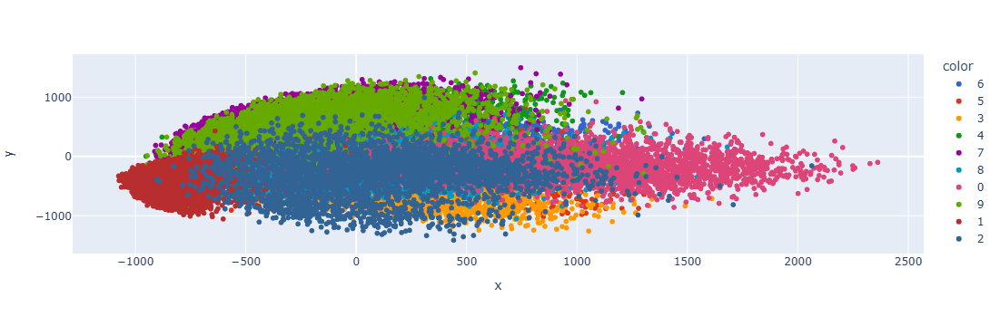

In [46]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [47]:
# transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)


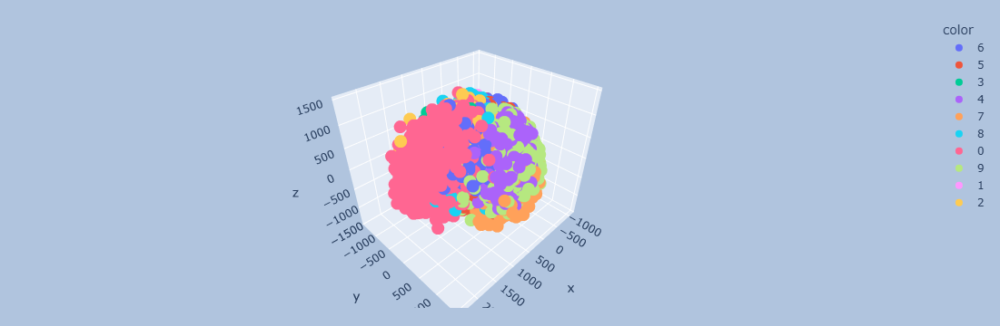

In [48]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()